# KodeinKGP AI/ML Task

In this document we explre how to make a decision tree classifier for predicting the condition of the breast cancer patients.
This dataset of breast cancer patients was sourced from the SEER Program's November 2017 update, which offers population-based cancer statistics. It includes data on female patients diagnosed between 2006 and 2010 with infiltrating duct and lobular carcinoma of the breast (histology codes 8522/3 according to SEER primary site recode NOS).

I could not download it as a pdf, if it is an issue I can send the HTML file to you. Just send a text to 9351807970 or mail to 18neevpohani@gmail.com

***
## Why a Decision Tree ?
Most commonly used, easy to understand, easy to implement and offers good level of accuracy. It prevents wrong diagnosis, if the patient is really suffering from heart disese or is it just chest pain? The doctors can collect all sorts of data from the patient from various tests, and collect data on the lifestyle, etc. whichever is needed and then simply diagnose with the help of this decision tree.
***

### Why not a Regression Model or any other Algorithm
In linear regression we, change the values of the weights and biases trying to predict the target value, minimising the gap in every iteration. In the case of decision tree we split the data after every node, and the nodes are arrganed in the order such that higher node splits the data more accurately than the lower one. By doing so we reduce the risks of misdiagnosis, if we get the first steps wrong we are bound to get the incorrect result. 

Other than that, lets take an example, lets say we have to quantify something which is categorical, like Martial Status of a person. Now a person can be Unmarried, Married, Seperated or Divorced, etc. but how do we convert these categories into numbers that can be used for linear regression. One good method would be to allot numbers to each category say 

* Unmarried - 1
* Married   - 2
* Seperated - 3
* Divorced  - 4

So in a linear regression model, the features varies between 1,2,3 and 4. but the problem is that the algorithm will try to figure out a relation between, say, 2 and 3 i.e. Married and Seperated which are two very different things, and this is one of the instances where the algorithm may fail.

In a decision tree however, we can use a binary or boolean approach to the problem, considering all the possible categories given to us, in this case martial status. So the nodes will split the data on the basis, 'if the person is {martial status} or not?'.
***

### About me
So I am relatively new to this field, and I am doing my best to understand this. So I started off by taking a course on ML on Coursera on Linear Regression and Classfication but soon enough Mid-Sems showed up and when this task came up I was baffled(The course is still incomplete). So I took help from the resourses provided in the Document, the StatQuest video and YouTube in general. If I couldn't understand a concept, I took help from Copilot aswell. I do have the understanding of how the decision tree functions and the mathematics behind it all, but the python syntax is a bit unfamiliar.

***
## Challenges Faced in the Process
So the biggest challenge i faced was that the data file had the columns data type set as 'object'. So during One-hot encoding, it kept showing error about how it cannot itself change from 'object' to any other data type. So I used the panda dummies method, where then again stood another problem.
Instead of binary, it came up as boolean. Indicating True/False which the code was not taking as the input for the decision tree. So I used Copilot for this and created a loop for all the columns with data type 'bool' and mapped all Trues as 1 and all Falses as 0.

Another minor error I made was that accidently the target was being considered as a feature in the code. So I had to drop the target column from the orignal data and create a seperate dataframe. 
***

## The Code 
So first we import all the necessary libraries, for ML the holy trinity i.e. NumPy, Pandas and MathPlotLib.
And other libraries to help with visualisation and data interpretation.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import plot_tree
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn import tree
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import LabelEncoder

So firsty we need to import the data into the system so that we can work on it. So we do it with the help of `pd.read_csv` function which gather information intelligently and divides them into columns.

In [ ]:
df = pd.read_csv('Breast_Cancer(1).csv')

So let's open up the file and see the data with the help of `.head()` function which displays the first 5 rows of the data.

In [ ]:
df.head()

,Age,Race,Marital Status,T Stage,N Stage,6th Stage,differentiate,Grade,A Stage,Tumor Size,Estrogen Status,Progesterone Status,Regional Node Examined,Reginol Node Positive,Survival Months,Status
0,68,White,Married,T1,N1,IIA,Poorly differentiated,3,Regional,4,Positive,Positive,24,1,60,Alive
1,50,White,Married,T2,N2,IIIA,Moderately differentiated,2,Regional,35,Positive,Positive,14,5,62,Alive
2,58,White,Divorced,T3,N3,IIIC,Moderately differentiated,2,Regional,63,Positive,Positive,14,7,75,Alive
3,58,White,Married,T1,N1,IIA,Poorly differentiated,3,Regional,18,Positive,Positive,2,1,84,Alive
4,47,White,Married,T2,N1,IIB,Poorly differentiated,3,Regional,41,Positive,Positive,3,1,50,Alive


***
So we now drop the target variable 'Status' i.e. Dead or Alive from the original Dataframe using the `.drop('<column>', axis=1)` funciton, this creates a new dataset 'X', so the changes made to 'X' do not affect the original dataframe. 
And create a seperate dataframe for the target variable only.

In [ ]:
X = df.drop('Status', axis=1).copy()
y = df['Status'].copy()

X.head()

,Age,Race,Marital Status,T Stage,N Stage,6th Stage,differentiate,Grade,A Stage,Tumor Size,Estrogen Status,Progesterone Status,Regional Node Examined,Reginol Node Positive,Survival Months
0,68,White,Married,T1,N1,IIA,Poorly differentiated,3,Regional,4,Positive,Positive,24,1,60
1,50,White,Married,T2,N2,IIIA,Moderately differentiated,2,Regional,35,Positive,Positive,14,5,62
2,58,White,Divorced,T3,N3,IIIC,Moderately differentiated,2,Regional,63,Positive,Positive,14,7,75
3,58,White,Married,T1,N1,IIA,Poorly differentiated,3,Regional,18,Positive,Positive,2,1,84
4,47,White,Married,T2,N1,IIB,Poorly differentiated,3,Regional,41,Positive,Positive,3,1,50


In [ ]:
y

0       Alive
1       Alive
2       Alive
3       Alive
4       Alive
        ...  
4019    Alive
4020    Alive
4021    Alive
4022    Alive
4023    Alive
Name: Status, Length: 4024, dtype: object

### Dummies for Dum-Dums
So dummies is a function in the pandas library, which creates seperate columns for each category of the column for the selected columns, and then for each row of the dataframe it represents a 0,1 telling us if that row had that category or not. We need not do this for the columns where there are only two categories, it's either one or the other. So columns like Estrogen Status, Progesterone Status, A Stage and other columns which rely on numerical inputs like Size and Age. 

So we create a new Dataframe called X_encoded which also has these 'dummies'. Also note that all the columns which have been 'dummi-fied' are inserted from the end and the original column is removed.

In [ ]:
print(X.columns)

Index(['Age', 'Race', 'Marital Status', 'T Stage ', 'N Stage', '6th Stage',
       'differentiate', 'Grade', 'A Stage', 'Tumor Size', 'Estrogen Status',
       'Progesterone Status', 'Regional Node Examined',
       'Reginol Node Positive', 'Survival Months'],
      dtype='object')


In [ ]:
X_encoded = pd.get_dummies(X, columns=[
              'Race',
              'Marital Status',
              'T Stage ', 
              'N Stage',
              '6th Stage', 
              'differentiate', 
              'Grade'
              ])

So here we encounter one more problem, that was prevously mentioned. The data type created a huge mess in the code so I have to change all the True to 1 and all False to 0. I do not know why it does not accept boolean values, it makes almost no difference.

In [ ]:
X_encoded.head()

,Age,A Stage,Tumor Size,Estrogen Status,Progesterone Status,Regional Node Examined,Reginol Node Positive,Survival Months,Race_Black,Race_Other,...,6th Stage_IIIB,6th Stage_IIIC,differentiate_Moderately differentiated,differentiate_Poorly differentiated,differentiate_Undifferentiated,differentiate_Well differentiated,Grade_ anaplastic; Grade IV,Grade_1,Grade_2,Grade_3
0,68,Regional,4,Positive,Positive,24,1,60,False,False,...,False,False,False,True,False,False,False,False,False,True
1,50,Regional,35,Positive,Positive,14,5,62,False,False,...,False,False,True,False,False,False,False,False,True,False
2,58,Regional,63,Positive,Positive,14,7,75,False,False,...,False,True,True,False,False,False,False,False,True,False
3,58,Regional,18,Positive,Positive,2,1,84,False,False,...,False,False,False,True,False,False,False,False,False,True
4,47,Regional,41,Positive,Positive,3,1,50,False,False,...,False,False,False,True,False,False,False,False,False,True


As you can see all the column data types were either object and now set to boolean.

In [ ]:
X_encoded.dtypes

Age                                         int64
A Stage                                    object
Tumor Size                                  int64
Estrogen Status                            object
Progesterone Status                        object
Regional Node Examined                      int64
Reginol Node Positive                       int64
Survival Months                             int64
Race_Black                                   bool
Race_Other                                   bool
Race_White                                   bool
Marital Status_Divorced                      bool
Marital Status_Married                       bool
Marital Status_Separated                     bool
Marital Status_Single                        bool
Marital Status_Widowed                       bool
T Stage _T1                                  bool
T Stage _T2                                  bool
T Stage _T3                                  bool
T Stage _T4                                  bool


***
So now with some help from CoPilot and using the `LabelEncoder()` function I changed the True/False to 1/0.

`LabelEncoder()` learns the categories entered in the column and then allocates integers to the string/value which it observes first in the same order and then maps the same integer if the string/value is repeated.

In [ ]:
label_encoder = LabelEncoder()
object_columns = X_encoded.select_dtypes(include=['bool', 'object']).columns

for col in object_columns:
    X_encoded[col] = label_encoder.fit_transform(X_encoded[col])

In [ ]:
X_encoded.head()

,Age,A Stage,Tumor Size,Estrogen Status,Progesterone Status,Regional Node Examined,Reginol Node Positive,Survival Months,Race_Black,Race_Other,...,6th Stage_IIIB,6th Stage_IIIC,differentiate_Moderately differentiated,differentiate_Poorly differentiated,differentiate_Undifferentiated,differentiate_Well differentiated,Grade_ anaplastic; Grade IV,Grade_1,Grade_2,Grade_3
0,68,1,4,1,1,24,1,60,0,0,...,0,0,0,1,0,0,0,0,0,1
1,50,1,35,1,1,14,5,62,0,0,...,0,0,1,0,0,0,0,0,1,0
2,58,1,63,1,1,14,7,75,0,0,...,0,1,1,0,0,0,0,0,1,0
3,58,1,18,1,1,2,1,84,0,0,...,0,0,0,1,0,0,0,0,0,1
4,47,1,41,1,1,3,1,50,0,0,...,0,0,0,1,0,0,0,0,0,1


So there's another catch here.....which is not that big a deal.
As the Label Encoder allots the string/value integers in the order in which it observes the data so, apparently the dataset has the first row corresponding to positives in all the categories so 0 is alloted to Positive.
Also that we have created 'dummies' so now whatever came up first either True or Falso was given 0 and the other 1. So there is no absolute sureity that in each column 1 stands for True and 0 stands for False. This however does not affect our final results in any way.

I am so new to this there must be way to stop all this from happening.

We do the same thing for the target variable now but now we are certain that Alive is 1 and Dead is 0.

In [ ]:
y = y.map({'Alive': 1, 'Dead': 0})
y.head()

0    1
1    1
2    1
3    1
4    1
Name: Status, dtype: int64

***
## Finally the Decision Tree

So before making the decision tree from the given data, we need to split it into 2 i.e. training data on which the model is trained, on the data which it makes tweaks and changes, and the testing data which will be used to test how well the model behaves.
A good proportion is 70:30 for Training Data : Testing Data. This ensures that our model is trained well enough and is tested by enough different possibilities and check it's accuracy and efficiency.



So the function `train_test_split()` splits the encoded data 'X_encoded'. `random_state=42` represents that the data would be split in exactly the same way everytime so it would be easier to compare.

In [ ]:
X_train, X_test, y_train, y_test =  train_test_split(X_encoded, y, test_size=0.3, random_state=42)

Now we create a Decision Tree and use the `fit()` function to train our model.

In [ ]:
clf = DecisionTreeClassifier(random_state=42)
clf = clf.fit(X_train, y_train)

Now We Visualise the tree. As the tree is very large, I cannot find the right parameters so that it can be displayed properly.

In [ ]:
plt.figure("Decision Tree", figsize=(200, 70))
plot_tree(clf,
          fontsize =15,
          filled=True,
          rounded=True,
          class_names=["Alive", "Dead"],
          feature_names=X_encoded.columns);

In [ ]:
## Validation Loss and Accuracy


So now for the Validation Loss in the Decision Tree

In [ ]:
from sklearn.model_selection import cross_val_score
# Calculate cross-validated scores for training
train_scores = cross_val_score(clf, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
val_scores = cross_val_score(clf, X_test, y_test, cv=5, scoring='neg_mean_squared_error')

# Calculate the mean and standard deviation of the validation scores
mean_train_loss = -train_scores.mean()
mean_val_loss = -val_scores.mean()

print(f'Mean Training Loss: {mean_train_loss}')
print(f'Mean Validation Loss: {mean_val_loss}')

Mean Training Loss: 0.16761397276494966
Mean Validation Loss: 0.14987826206234353


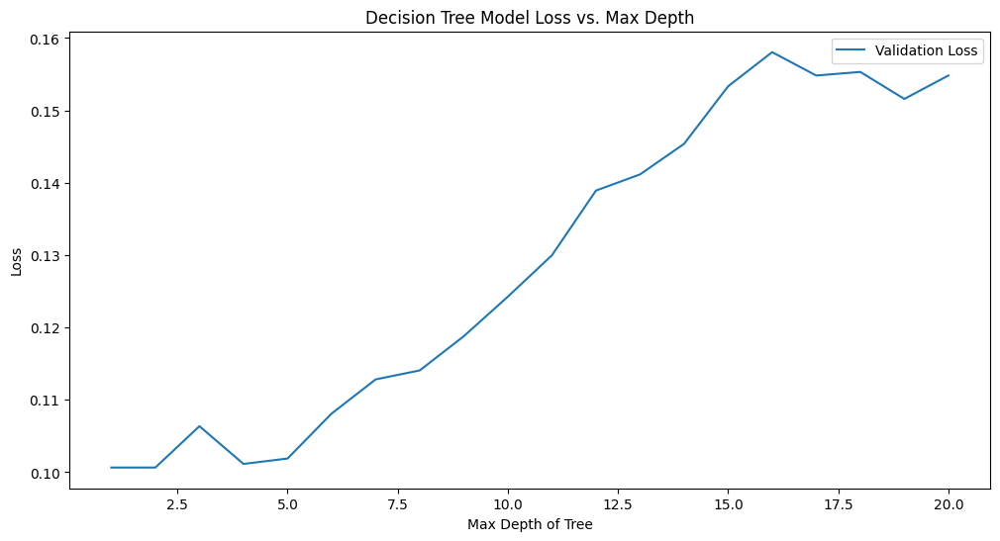

In [ ]:
from sklearn.metrics import mean_squared_error
# Initialize lists to store losses
val_losses = []

# Iterate over max_depth values
for depth in range(1, 21):
    clf_loss = DecisionTreeClassifier(max_depth=depth)
    clf_loss.fit(X_test, y_test)
  
    # Validation loss
    y_val_pred = cross_val_score(clf_loss, X_encoded, y, cv=5, scoring='neg_mean_squared_error')
    val_loss = -y_val_pred.mean()  # Since cross_val_score returns negative MSE
    val_losses.append(val_loss)

# Plot the results
plt.figure(figsize=(12, 6))
plt.plot(range(1, 21), val_losses, label='Validation Loss')
plt.xlabel('Max Depth of Tree')
plt.ylabel('Loss')
plt.title('Decision Tree Model Loss vs. Max Depth')
plt.legend()
plt.show()

In [ ]:
from sklearn.metrics import accuracy_score

# Predict on test set
y_pred = clf.predict(X_test)

# Calculate accuracy on test set
accuracy = accuracy_score(y_test, y_pred)
print(f'Validation Accuracy: {accuracy}')

# Using cross-validation to get a more robust estimate
cv_scores = cross_val_score(clf, X_encoded, y, cv=5, scoring='accuracy')
print(f'Cross-Validated Accuracy Scores: {cv_scores}')
print(f'Mean Cross-Validated Accuracy: {cv_scores.mean()}')

Validation Accuracy: 0.8559602649006622
Cross-Validated Accuracy Scores: [0.85341615 0.82857143 0.8310559  0.85465839 0.85199005]
Mean Cross-Validated Accuracy: 0.8439383826210562


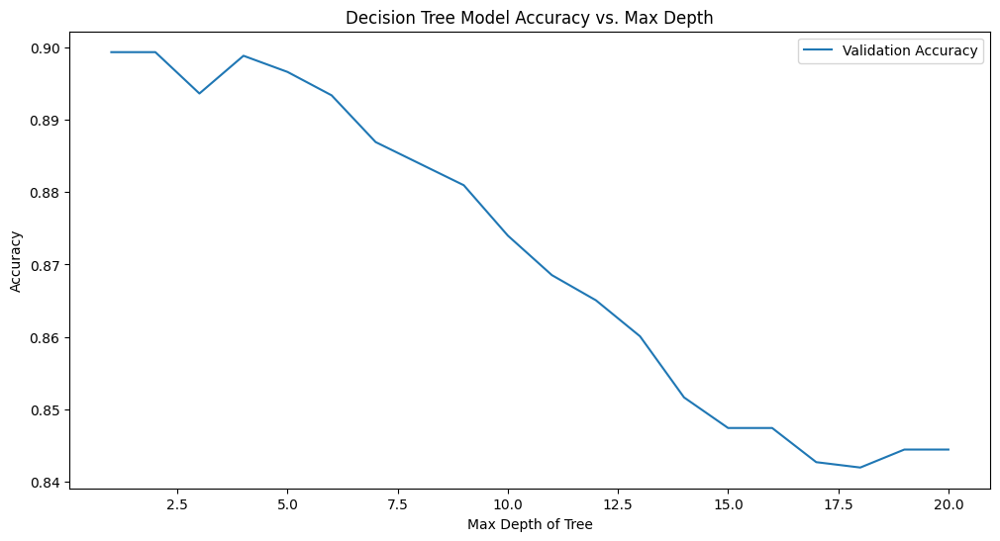

In [ ]:
# Initialize lists to store scores
val_scores = []

# Iterate over max_depth values
for depth in range(1, 21):
    clf_acc = DecisionTreeClassifier(max_depth=depth)
    clf_acc.fit(X_test, y_test)
     
    # Validation accuracy using cross-validation
    val_accuracy = cross_val_score(clf_acc, X_encoded, y, cv=5, scoring='accuracy').mean()
    val_scores.append(val_accuracy)

# Plot the results
plt.figure(figsize=(12, 6))
plt.plot(range(1, 21), val_scores, label='Validation Accuracy')
plt.xlabel('Max Depth of Tree')
plt.ylabel('Accuracy')
plt.title('Decision Tree Model Accuracy vs. Max Depth')
plt.legend()
plt.show()

## Confusion Matrix
It helps us to visualise the predictions made by the model and whether they were accurate or not.
We can see that it has correctly predicted 1034 out of 1208 cases correctly which is approximately 85.6%.

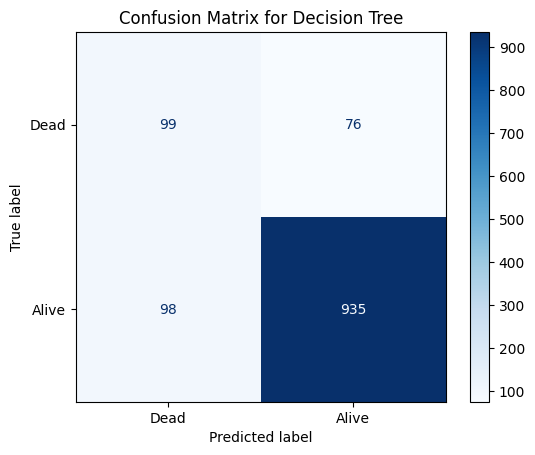

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay
y_pred = clf.predict(X_test)
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Dead', 'Alive'])
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix for Decision Tree')
plt.show()

## Optional Task 1.
### Using the Entropy Method



In [ ]:
# Build the decision tree classifier using entropy
clf_entropy = DecisionTreeClassifier(criterion='entropy')
clf_entropy.fit(X_train, y_train)

# Predict on test set
predictions = clf_entropy.predict(X_test)
#print(predictions)

# Visualize the tree
plt.figure("Decision Tree", figsize=(200, 70))
plot_tree(clf_entropy, feature_names=X_encoded.columns, class_names=['Dead', 'Alive'], filled=True)

[Text(0.4030439621175908, 0.98, 'Survival Months <= 47.5\nentropy = 0.626\nsamples = 2816\nvalue = [441, 2375]\nclass = Alive'),
 Text(0.13539674952198852, 0.94, 'Age <= 61.5\nentropy = 0.866\nsamples = 337\nvalue = [240.0, 97.0]\nclass = Dead'),
 Text(0.26922035581978965, 0.96, 'True  '),
 Text(0.07194072657743786, 0.9, 'Progesterone Status <= 0.5\nentropy = 0.954\nsamples = 246\nvalue = [154, 92]\nclass = Dead'),
 Text(0.02676864244741874, 0.86, 'Estrogen Status <= 0.5\nentropy = 0.617\nsamples = 85\nvalue = [72.0, 13.0]\nclass = Dead'),
 Text(0.0076481835564053535, 0.82, 'Tumor Size <= 7.0\nentropy = 0.332\nsamples = 49\nvalue = [46, 3]\nclass = Dead'),
 Text(0.0038240917782026767, 0.78, 'entropy = 0.0\nsamples = 1\nvalue = [0, 1]\nclass = Alive'),
 Text(0.011472275334608031, 0.78, '6th Stage_IIB <= 0.5\nentropy = 0.25\nsamples = 48\nvalue = [46, 2]\nclass = Dead'),
 Text(0.0076481835564053535, 0.74, 'entropy = 0.0\nsamples = 37\nvalue = [37, 0]\nclass = Dead'),
 Text(0.015296367112

In [ ]:
# Calculate accuracy
accuracy = accuracy_score(y_test, predictions)
print(f'Accuracy: {accuracy}')

Accuracy: 0.8600993377483444


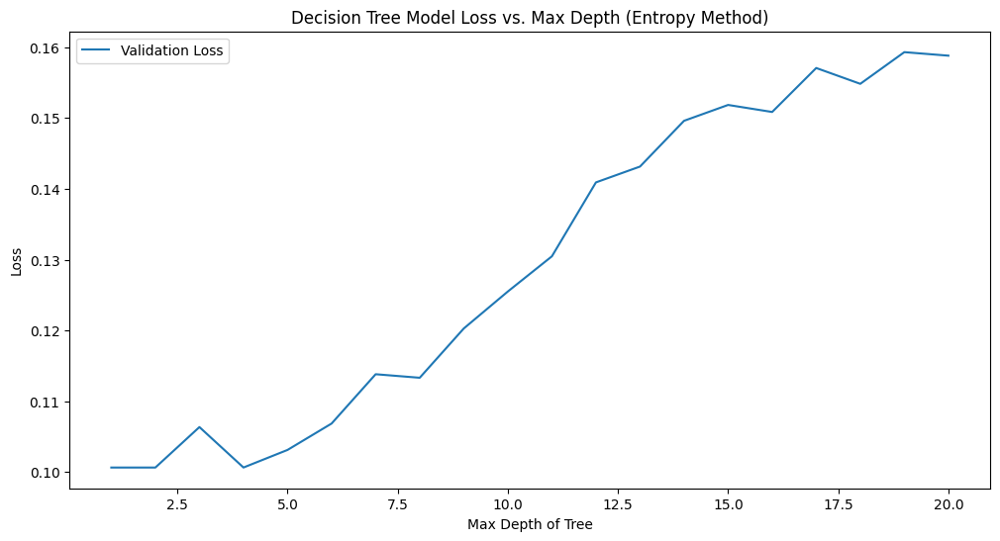

In [ ]:
#validation loss
from sklearn.metrics import mean_squared_error
# Initialize lists to store losses
val_losses_e = []

# Iterate over max_depth values
for depth in range(1, 21):
    clf_loss_e = DecisionTreeClassifier(max_depth=depth)
    clf_loss_e.fit(X_test, y_test)
  
    # Validation loss
    y_val_pred_e = cross_val_score(clf_loss_e, X_encoded, y, cv=5, scoring='neg_mean_squared_error')
    val_loss_e = -y_val_pred_e.mean()  # Since cross_val_score returns negative MSE
    val_losses_e.append(val_loss_e)

# Plot the results
plt.figure(figsize=(12, 6))
plt.plot(range(1, 21), val_losses_e, label='Validation Loss')
plt.xlabel('Max Depth of Tree')
plt.ylabel('Loss')
plt.title('Decision Tree Model Loss vs. Max Depth (Entropy Method)')
plt.legend()
plt.show()

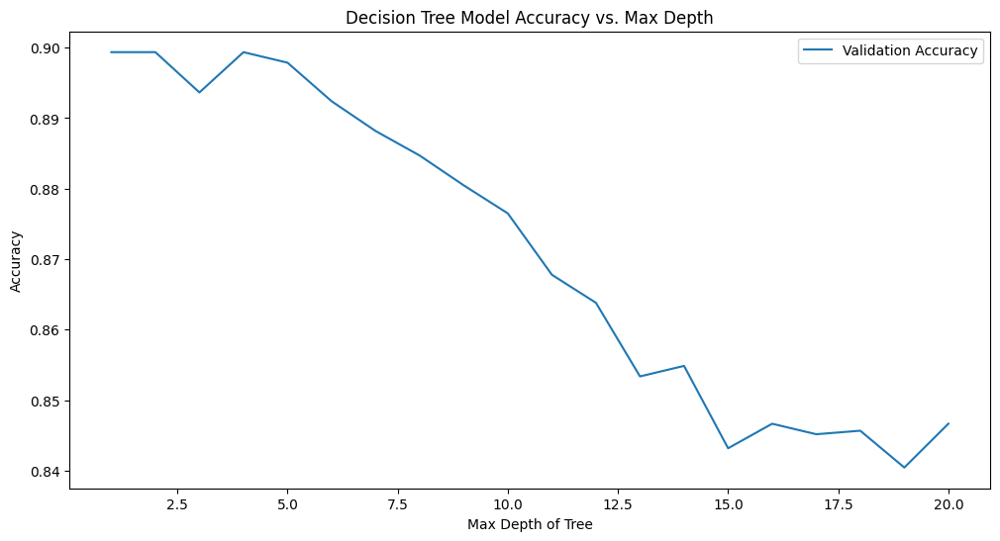

In [ ]:
#validation accuracy
# Initialize lists to store scores
val_scores_e = []

# Iterate over max_depth values
for depth in range(1, 21):
    clf_acc_e = DecisionTreeClassifier(max_depth=depth)
    clf_acc_e.fit(X_test, y_test)
     
    # Validation accuracy using cross-validation
    val_accuracy_e = cross_val_score(clf_acc_e, X_encoded, y, cv=5, scoring='accuracy').mean()
    val_scores_e.append(val_accuracy_e)

# Plot the results
plt.figure(figsize=(12, 6))
plt.plot(range(1, 21), val_scores_e, label='Validation Accuracy')
plt.xlabel('Max Depth of Tree')
plt.ylabel('Accuracy')
plt.title('Decision Tree Model Accuracy vs. Max Depth')
plt.legend()
plt.show()


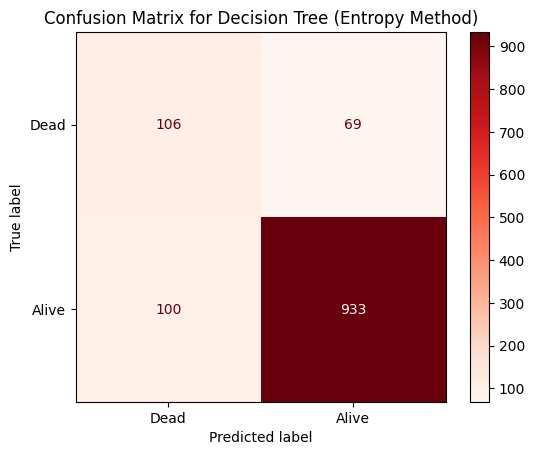

In [ ]:
cm_entropy = confusion_matrix(y_test, predictions)
disp_entropy = ConfusionMatrixDisplay(confusion_matrix=cm_entropy, display_labels=['Dead', 'Alive'])
disp_entropy.plot(cmap=plt.cm.Reds)
plt.title('Confusion Matrix for Decision Tree (Entropy Method)')
plt.show()